In [1]:
import numpy as np
import os

# Plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import colors
import matplotlib.gridspec as grid_spec
from mpl_toolkits.axes_grid1 import make_axes_locatable
import plotly.express as px
# Ridgeline plots
import joypy
import yaml

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

from src.parameter_distributions import parameter_distributions
from src.feature_extraction import coarsen_density, scale_density, split_data
from src.cluster_data import clustering_pipeline

In [2]:
# Aggregate descriptor data if not already aggregated into the proper file
if not os.path.isfile("../data/dataset2/density.npy"):
    compile_data(2)

In [3]:
import sys, importlib

import pyximport
pyximport.install(setup_args={'include_dirs': np.get_include()},
                  language_level = 3
                 )
import src.ks_statistic as ks

In [4]:
if not os.path.isfile("../data/dataset2/8x8_density.npy"):
    
    old_density = np.load("../data/dataset2/density.npy", allow_pickle = True)
 
    coarse_resolution = (25)**2
    density = np.empty((45*121*10, coarse_resolution))
    for i, v in enumerate(old_density):
        v = v.reshape(200,200)
        coarse_v = coarsen_density(v, I = 200, h = 1000/(199.0), bin_size = 8)
        density[i] = coarse_v
    
    np.save("../data/dataset2/8x8_density.npy", density, allow_pickle = True)

## Confusion Matrix and OOS Accuracy Computation

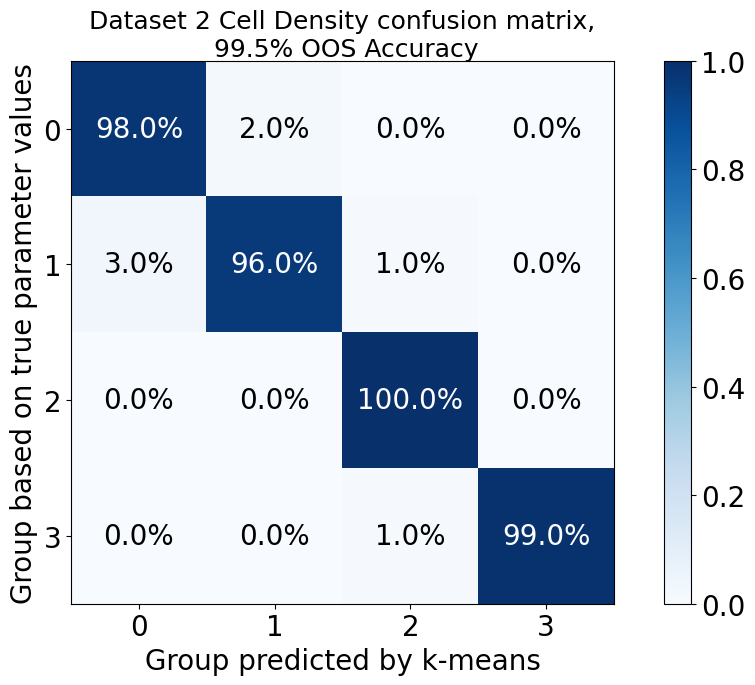

In [5]:
num_clusters = 4
density = np.load("../data/dataset2/8x8_density.npy",allow_pickle = True)
out = clustering_pipeline(X = density,
                    descriptor_name = 'density',
                    title = 'Dataset 2 Cell Density',
                    scaler = scale_density,
                    descriptor_size = 25**2, 
                    num_clusters = num_clusters)

## PCA Projection

In [6]:
density_reduced = out['X_reduced']
density_labels = out['X_labels']
var = out['explained_variance_ratio']

pca_fig = px.scatter_3d(x=density_reduced[:, 0],
                        y=density_reduced[:, 1],
                        z=density_reduced[:, 2],
                        color=density_labels, labels = {'x': f"(x) {100*var[0]:.2f}% variance",
                                                              'y': f"(y) {100*var[1]:.2f}% variance",
                                                              'z':f"(z) {100*var[2]:.2f}% variance"},
                        title = "Dataset 2 Cell Density")

pca_fig.update_traces(marker={'size': 2})
pca_fig.update_layout(autosize=False,
                             width = 1200,
                             height = 1000)
     
pca_fig.show()

## Locate Representative Phenotypes

In [7]:
# Find the sample closest to the centroid in each cluster
centroids = np.load("../results/dataset2/density_centers.npy", allow_pickle = True)
phenotype_inds = np.empty(num_clusters, dtype = int)

for c in np.arange(num_clusters):
    phenotype_inds[c] = np.argmin(np.linalg.norm(density_reduced - centroids[c], axis = 1))
np.save("../results/dataset2/density_phenotype_inds.npy", phenotype_inds, allow_pickle = True)


## Parameter Distributions 

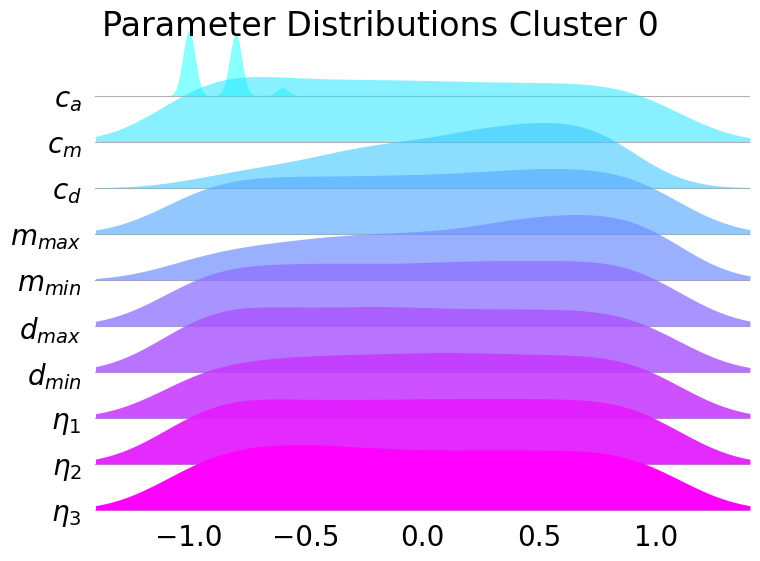

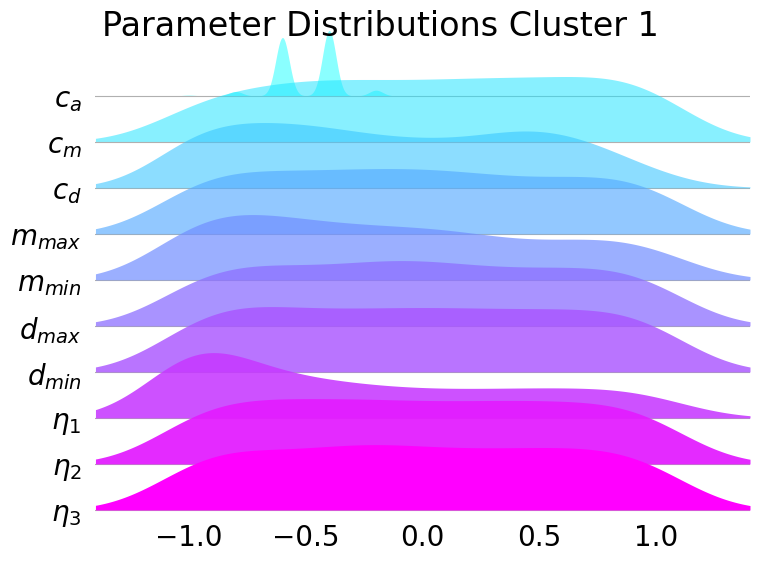

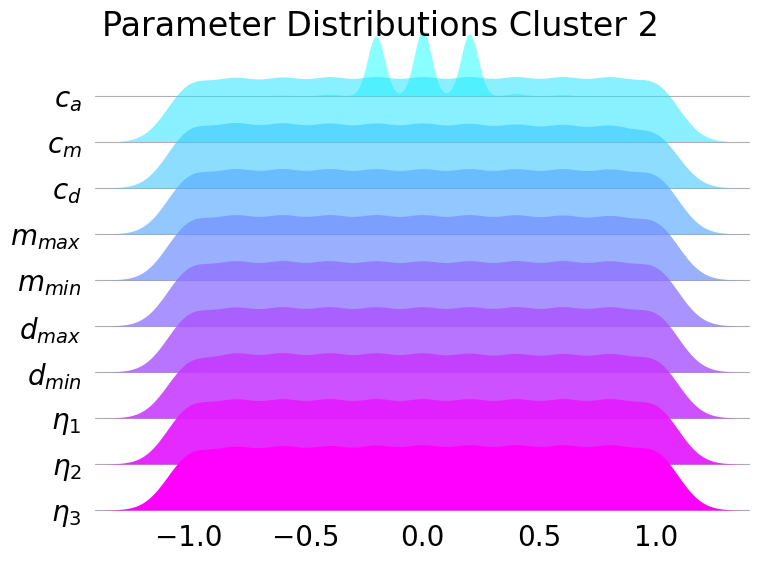

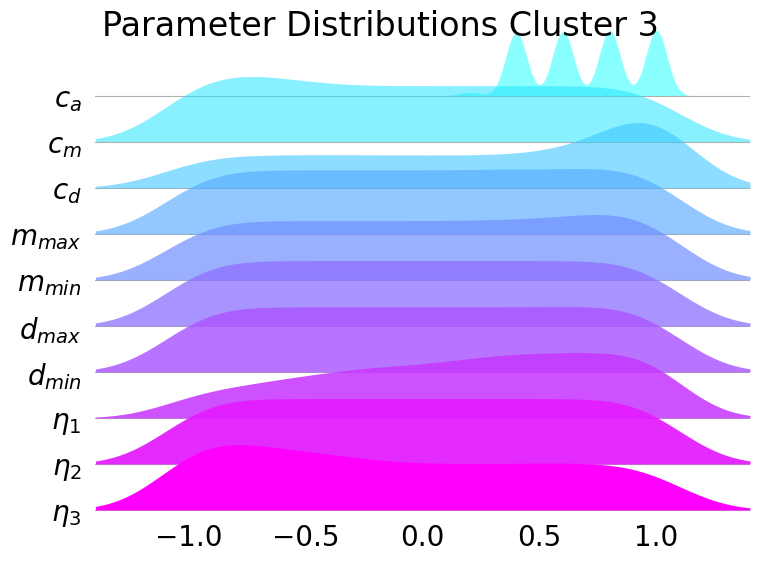

In [8]:
cluster_distns = []
for cluster_num in np.arange(num_clusters):
    cluster_distn = parameter_distributions(labels = density_labels,
                                            cluster_num = cluster_num,
                                            n_itrs = 10)
    cluster_distns.append(cluster_distn)

# Using 1/φ as the overlap parameter for ridgeline plots
o = (1+np.sqrt(5))/2
distns_plot = []

for c in np.arange(num_clusters):
    param_distn_plot = {}
    param_distn_plot['$c_a$'] = cluster_distns[c]['c_a']
    param_distn_plot['$c_m$'] = cluster_distns[c]['c_m']
    param_distn_plot['$c_d$'] = cluster_distns[c]['c_d']
    
    param_distn_plot['$m_{max}$'] = cluster_distns[c]['mmax']
    param_distn_plot['$m_{min}$'] = cluster_distns[c]['mmin']
    param_distn_plot['$d_{max}$'] = cluster_distns[c]['dmax']
    param_distn_plot['$d_{min}$'] = cluster_distns[c]['dmin']
    
    param_distn_plot['$\eta_1$'] = cluster_distns[c]['eta1']
    param_distn_plot['$\eta_2$'] = cluster_distns[c]['eta2']
    param_distn_plot['$\eta_3$'] = cluster_distns[c]['eta3']
    distns_plot.append(param_distn_plot)

# Creating Ridgeline plots of parameter distributions in each cluster
for c in range(num_clusters):
    fig, ax = joypy.joyplot(distns_plot[c],
                            colormap = mpl.colormaps['cool'].resampled(10),
                            figsize = (8,6),
                            linecolor='#f0f0f0',
                            bins = 11,
                            grid = 'y',
                            ylabelsize = 20,
                            xlabelsize = 20,
                            ylim ='own',
                            overlap = 1/(2*o),
                            fade=True,
                            linewidth = 0)
    ax[-1].xaxis.set_ticks_position('none')
    fig.suptitle(f"Parameter Distributions Cluster {c}")
    plt.show()
    fig.savefig(f"../figures/dataset2/density_ridgeline_cluster_{c}.png")

## Compare Clusters with Discrete 2-Sample Kolmogorov-Smirnov Test

In [9]:
ks_stats = {}
permutation_test_iterations = 1000
for param in cluster_distns[0].keys():
    ks_stats[param] = []
    for c1 in np.arange(num_clusters):
        for c2 in np.arange(c1 + 1, num_clusters):
            p_val = ks.ks_disc_2sample(samples1 = cluster_distns[c1][param],
                                       samples2 = cluster_distns[c2][param],
                                       iters = permutation_test_iterations)
            ks_stats[param].append(p_val)
    ks_stats[param] = np.array(ks_stats[param])

ks_df = pd.DataFrame.from_dict(data = ks_stats,
                               orient = 'index',
                               columns = [f"({c1},{c2})" for c1 in np.arange(num_clusters) for c2 in np.arange(c1+1, num_clusters)])
ks_df.index = list(ks_stats.keys())

ks_df.to_csv(f'../results/dataset2/density_ks_stats_{permutation_test_iterations}.csv')
display(ks_df)

,"(0,1)","(0,2)","(0,3)","(1,2)","(1,3)","(2,3)"
c_a,0.000,0.000,0.000,0.000,0.000,0.000
c_d,0.000,0.014,0.000,0.026,0.000,0.000
c_m,0.503,0.408,0.932,0.929,0.626,0.117
dmax,0.961,0.918,0.990,0.687,0.805,0.904
dmin,1.000,0.650,0.763,0.730,0.872,0.906
mmax,0.600,0.917,0.938,0.579,0.483,0.920
mmin,0.000,0.393,0.232,0.009,0.007,0.966
eta1,0.000,0.918,0.008,0.000,0.000,0.284
eta2,1.000,0.792,0.938,0.785,0.894,0.894
eta3,0.997,0.615,0.793,0.761,0.432,0.001
